In [7]:
import matplotlib.pyplot as plt
import pandas as pd
from utils import *
from matplotlib.colors import ListedColormap
from matplotlib.ticker import FuncFormatter


%matplotlib inline

#increase plot size
plt.rcParams['figure.figsize'] = [20, 10]

import numpy as np
# maximum print option
np.set_printoptions(linewidth=400)

from model import Schelling

In [8]:
neighborhood_model = Schelling(width = 50, height = 50, density = 0.75, minority_pc = 0.3, homophily = 3,  policy = 'similar_history_neighborhood', follow_policy=1.0, altruism = 0.0)
cell_model = Schelling(width = 50, height = 50, density = 0.75, minority_pc = 0.3, homophily = 3,  policy = 'similar_history_cell', follow_policy=1.0, altruism = 0.0)

/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/mesa/agent.py:52: FutureWarning: The Mesa Model class was not initialized. In the future, you need to explicitly initialize the Model by calling super().__init__() on initialization.
  self.model.register_agent(self)
/Users/richard/University/css/css/model.py:123: UserWarning: Agent 0 is being placed with
place_agent() despite already having the position (0, 0). In most
cases, you'd want to clear the current position with remove_agent()
before placing the agent again.
  self.grid.place_agent(agent, (x, y))
/Users/richard/University/css/css/model.py:123: UserWarning: Agent 1 is being placed with
place_agent() despite already having the position (0, 1). In most
cases, you'd want to clear the current position with remove_agent()
before placing the agent again.
  self.grid.place_agent(agent, (x, y))
/Users/richard/University/css/css/model.py:123: UserWarning: Agent 2 is being placed with
place_agent() despite already having 

In [9]:
while neighborhood_model.running and neighborhood_model.schedule.steps < 100:
    neighborhood_model.step()
print(neighborhood_model.schedule.steps)  # Show how many steps have actually run
neighborhood_model_out = neighborhood_model.datacollector.get_model_vars_dataframe()
neighborhood_model_out

10


,perc_happy,segregation
0,0.726496,0.601763
1,0.930021,0.646768
2,0.975962,0.660123
3,0.989316,0.665732
4,0.994124,0.669204
5,0.998397,0.670406
6,0.999466,0.670406
7,0.999466,0.670406
8,0.999466,0.670673
9,1.000000,0.670673


In [10]:
while cell_model.running and cell_model.schedule.steps < 100:
    cell_model.step()
print(cell_model.schedule.steps)  # Show how many steps have actually run
cell_model_out = cell_model.datacollector.get_model_vars_dataframe()
cell_model_out

100


,perc_happy,segregation
0,0.672078,0.432630
1,0.699134,0.432900
2,0.702381,0.434794
3,0.702922,0.437500
4,0.706169,0.438988
...,...,...
95,0.709957,0.438718
96,0.716450,0.440476
97,0.709957,0.439123
98,0.705087,0.440882


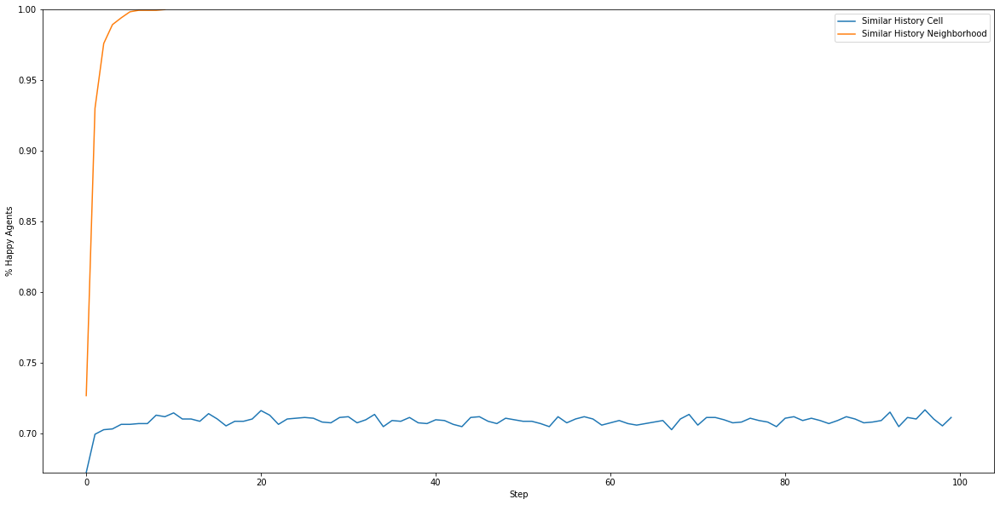

In [15]:
cell_model_out.perc_happy.plot(label="Similar History Cell")
neighborhood_model_out.perc_happy.plot(label="Similar History Neighborhood")
plt.xlabel("Step")
plt.ylabel("% Happy Agents")
plt.ylim(min(min(cell_model_out.perc_happy), min(neighborhood_model_out.perc_happy)),1)
plt.legend()


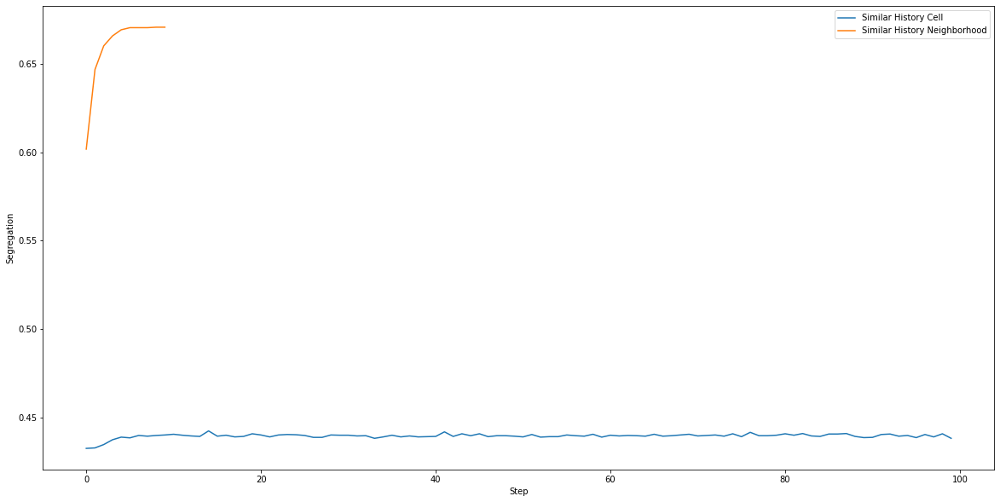

In [16]:
cell_model_out.segregation.plot(label="Similar History Cell")
neighborhood_model_out.segregation.plot(label="Similar History Neighborhood")
plt.xlabel("Step")
plt.ylabel("Segregation")
plt.legend()

In [3]:
from mesa import batch_run
fixed_params = {
    'width': 50,
    'height': 50,
    'density': 0.75,
    'minority_pc': 0.4,
    'homophily': 3,
    'follow_policy': 1.0
}

policies = ["similar_history_neighborhood", "similar_history_cell", "maximum_improvement", "minimum_improvement"]

variable_parms = {"policy": policies}

merged_params = {**fixed_params, **variable_parms}

pd.options.mode.chained_assignment = None

results = batch_run(
    Schelling,
    parameters = merged_params,
    iterations=5,
    max_steps=100,
    number_processes = None
);

results_df = pd.DataFrame(results)

  0%|          | 0/20 [00:00<?, ?it/s]

/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/mesa/agent.py:52: FutureWarning: The Mesa Model class was not initialized. In the future, you need to explicitly initialize the Model by calling super().__init__() on initialization.
  self.model.register_agent(self)
/Users/richard/University/css/css/model.py:123: UserWarning: Agent 0 is being placed with
place_agent() despite already having the position (0, 1). In most
cases, you'd want to clear the current position with remove_agent()
before placing the agent again.
  self.grid.place_agent(agent, (x, y))
/Users/richard/University/css/css/model.py:123: UserWarning: Agent 1 is being placed with
place_agent() despite already having the position (0, 3). In most
cases, you'd want to clear the current position with remove_agent()
before placing the agent again.
  self.grid.place_agent(agent, (x, y))
/Users/richard/University/css/css/model.py:123: UserWarning: Agent 2 is being placed with
place_agent() despite already having 

In [4]:
results_df.head(30)

,RunId,iteration,Step,width,height,density,minority_pc,homophily,follow_policy,policy,perc_happy,segregation
0,2,0,5,50,50,0.75,0.4,3,1.0,maximum_improvement,1.000000,0.738412
1,6,1,3,50,50,0.75,0.4,3,1.0,maximum_improvement,1.000000,0.750270
2,3,0,6,50,50,0.75,0.4,3,1.0,minimum_improvement,1.000000,0.547855
3,7,1,9,50,50,0.75,0.4,3,1.0,minimum_improvement,1.000000,0.548098
4,8,2,7,50,50,0.75,0.4,3,1.0,similar_history_neighborhood,1.000000,0.685816
5,0,0,10,50,50,0.75,0.4,3,1.0,similar_history_neighborhood,1.000000,0.698603
6,10,2,5,50,50,0.75,0.4,3,1.0,maximum_improvement,1.000000,0.752256
7,4,1,11,50,50,0.75,0.4,3,1.0,similar_history_neighborhood,1.000000,0.693188
8,11,2,5,50,50,0.75,0.4,3,1.0,minimum_improvement,1.000000,0.545051
9,14,3,4,50,50,0.75,0.4,3,1.0,maximum_improvement,1.000000,0.745106


In [5]:
results_df_grouped = results_df.groupby(['policy']).agg({'Step': ['std', 'mean'], 'segregation': ['std', 'mean'], 'perc_happy': ['std', 'mean']}).reset_index()
results_df_grouped

policy      Step        segregation            \
                                      std   mean         std      mean   
0           maximum_improvement  0.836660    4.2    0.005616  0.745754   
1           minimum_improvement  4.037326    7.6    0.002298  0.547729   
2          similar_history_cell  0.000000  100.0    0.005675  0.397338   
3  similar_history_neighborhood  1.643168    9.2    0.007637  0.693167   

  perc_happy            
         std      mean  
0    0.00000  1.000000  
1    0.00000  1.000000  
2    0.00908  0.661172  
3    0.00000  1.000000